#**M3 Wisconsin Breast Cancer Dataset**
This notebook seeks to accomplish data pre-processing to facilitate ML solution development for the Wisconsin Breast Cancer dataset available here: https://archive.ics.uci.edu/ml/datasets/breast+cancer+wisconsin+(diagnostic).







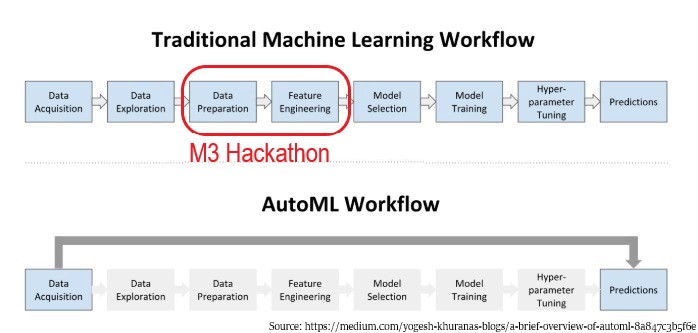

#**Table of Contents**
* Business Problem
* Executive Summary (BLUF)
* Conclusions from EDA Notebook
* Libraries
* Data
* Predictors & Target Variable
* Skewness Correction
* Outliers
* Balance
* Strength of Predictors
* Conclusions

#**Business Problem**
The business problem for this notebook is to execute data preprocessing requirements on the Wisconsin breast cancer data set, and, if possible, identify strong predictors.

#**Executive Summary (BLUF)**
- No missing value or duplicate pre-processing needed
- Corrected for skewness
- Winsorized outliers in order to preserve data
- Two to three principal components may be sufficient to build a satisfactory model
- The data set is unbalanced (37.26% of the instances are for malignant masses). We can try building the models using the unbalanced data, or we can try SMOTE. There is likely too little data to contemplate undersampling. 

#**Conclusions from EDA Notebook**
The conclusions reached in our EDA work on this dataset were as follows:
*   The dataset is tiny with only 568 instances (and 30 predictors)
*   There are no missing values or duplicates
*   Skewness correction would be preferred
*   Outliers need to be addressed, likely by winsorizing, because we can scarce afford to throw away any data.

#**Libraries**

In [1]:
# Basic libraries
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from scipy.stats.mstats import winsorize
import scipy.stats as ss
import math

In [2]:
# sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.datasets import load_breast_cancer
!pip install psynlig 
from psynlig import pca_explained_variance_bar
plt.style.use('seaborn-talk')

ERROR: Could not find a version that satisfies the requirement psynlig (from versions: none)
ERROR: No matching distribution found for psynlig


ModuleNotFoundError: No module named 'psynlig'

In [ ]:
# mblearn library
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as imbpipeline
from sklearn.pipeline import Pipeline
from sklearn.datasets import make_classification

#**Data**

Recall that the data dictionary for this dataset is as follows:

1) ID number
2) Diagnosis (M = malignant, B = benign)
3-32)

Ten real-valued features are computed for each cell nucleus:
- radius (mean of distances from center to points on the perimeter)
- texture (standard deviation of gray-scale values)
- perimeter
- area
- smoothness (local variation in radius lengths)
- compactness (perimeter^2 / area - 1.0)
- concavity (severity of concave portions of the contour)
- concave points (number of concave portions of the contour)
- symmetry 
- fractal dimension ("coastline approximation" - 1)

Various journal papers contain detailed descriptions of how these features are computed. 

The mean, standard error, and "worst" or largest (mean of the three
largest values) of these features were computed for each image,
resulting in 30 features.  For instance, field 3 is Mean Radius, field
13 is Radius SE, field 23 is Worst Radius.

In [ ]:
# Read in data from the sklearn library
cancer = load_breast_cancer()

# Column 1 is the target (1=malignant, 0 = benign)
# Note that np.c_ translates slice objects to concatenation along the second axis
df = pd.DataFrame(np.c_[cancer['target'],cancer['data']], columns = np.append(['target'],cancer['feature_names']))

# Plot the last 5 rows of the data
df.tail()

,target,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
564,0.0,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,0.0,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,0.0,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,0.0,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400
568,1.0,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,0.1587,...,9.456,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039


#**Predictors & Target Variable**


In [ ]:
# Extract predictors and target from df
X = df.drop(['target'],axis=1)
y = df['target']

# # Create binary-encoded target column (y)
# from sklearn import preprocessing
# y = pd.get_dummies(df.iloc[:,1],drop_first=True)

# #Drop ID and old target column to get predictors (X)
# X = df.drop(columns=[0,1])

# df = pd.concat([y,X],axis=1)

#**Skewness Correction**

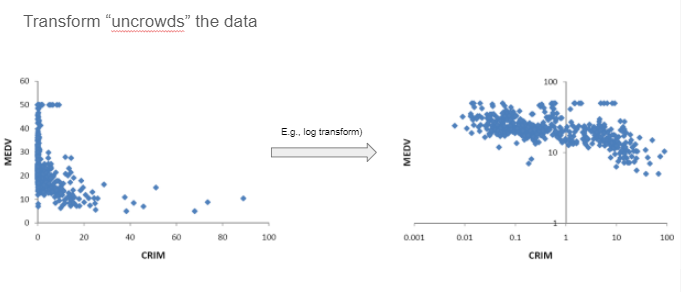

In [ ]:
# Code for skewness correction (see source below)
# Depending upon the characteritics of a feature (column), a log, Box-Cox or power transform is applied to normalize the distribution 

# -*- coding: utf-8 -*-
"""
Created on Sat Feb 23 14:42:46 2019
@author: DATAmadness
"""

##################################################
# A function that will accept a pandas dataframe
# and auto-transforms columns that exceeds threshold value
#  -  Offers choice between boxcox or log / exponential transformation
#  -  Automatically handles negative values
#  -  Auto recognizes positive /negative skewness

# Further documentation available here:
# https://datamadness.github.io/Skewness_Auto_Transform

def skew_autotransform(DF, include = None, exclude = None, plot = False, threshold = 1, exp = False):
    
    #Get list of column names that should be processed based on input parameters
    if include is None and exclude is None:
        colnames = DF.columns.values
    elif include is not None:
        colnames = include
    elif exclude is not None:
        colnames = [item for item in list(DF.columns.values) if item not in exclude]
    else:
        print('No columns to process!')
    
    #Helper function that checks if all values are positive
    def make_positive(series):
        minimum = np.amin(series)
        #If minimum is negative, offset all values by a constant to move all values to positive teritory
        if minimum <= 0:
            series = series + abs(minimum) + 0.01
        return series
    
    
    #Go through desired columns in DataFrame
    for col in colnames:
        #Get column skewness
        skew = DF[col].skew()
        transformed = True
        
        if plot:
            #Prep the plot of original data
            sns.set_style("darkgrid")
            sns.set_palette("Blues_r")
            fig, axes = plt.subplots(1, 2, figsize=(10, 5))
            #ax1 = sns.distplot(DF[col], ax=axes[0])
            ax1 = sns.histplot(DF[col], ax=axes[0], color="blue", label="100% Equities", kde=True, stat="density", linewidth=0)
            ax1.set(xlabel='Original ' + str(col))
        
        #If skewness is larger than threshold and positively skewed; If yes, apply appropriate transformation
        if abs(skew) > threshold and skew > 0:
            skewType = 'positive'
            #Make sure all values are positive
            DF[col] = make_positive(DF[col])
            
            if exp:
               #Apply log transformation 
               DF[col] = DF[col].apply(math.log)
            else:
                #Apply boxcox transformation
                DF[col] = ss.boxcox(DF[col])[0]
            skew_new = DF[col].skew()
         
        elif abs(skew) > threshold and skew < 0:
            skewType = 'negative'
            #Make sure all values are positive
            DF[col] = make_positive(DF[col])
            
            if exp:
               #Apply exp transformation 
               DF[col] = DF[col].pow(10)
            else:
                #Apply boxcox transformation
                DF[col] = ss.boxcox(DF[col])[0]
            skew_new = DF[col].skew()
        
        else:
            #Flag if no transformation was performed
            transformed = False
            skew_new = skew
        
        #Compare before and after if plot is True
        if plot:
            print('\n ------------------------------------------------------')     
            if transformed:
                print('\n %r had %r skewness of %2.2f' %(col, skewType, skew))
                print('\n Transformation yielded skewness of %2.2f' %(skew_new))
                sns.set_palette("Paired")
                #ax2 = sns.distplot(DF[col], ax=axes[1], color = 'r')
                ax2 = sns.histplot(DF[col], ax=axes[1], color="red", label="100% Equities", kde=True, stat="density", linewidth=0)
                ax2.set(xlabel='Transformed ' + str(col))
                plt.show()
            else:
                print('\n NO TRANSFORMATION APPLIED FOR %r . Skewness = %2.2f' %(col, skew))
                #ax2 = sns.distplot(DF[col], ax=axes[1])
                ax2 = sns.histplot(DF[col], ax=axes[1], color="blue", label="100% Equities", kde=True, stat="density", linewidth=0)
                ax2.set(xlabel='NO TRANSFORM ' + str(col))
                plt.show()
                

    return DF


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'mean radius' . Skewness = 0.94


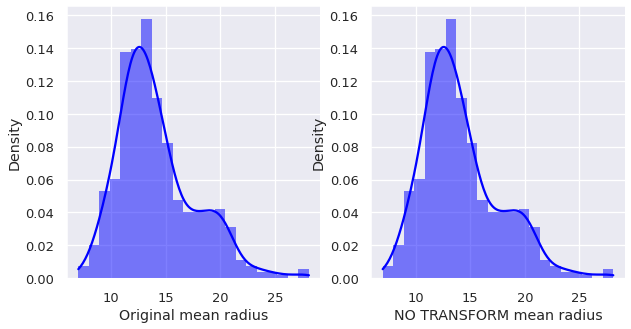


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'mean texture' . Skewness = 0.65


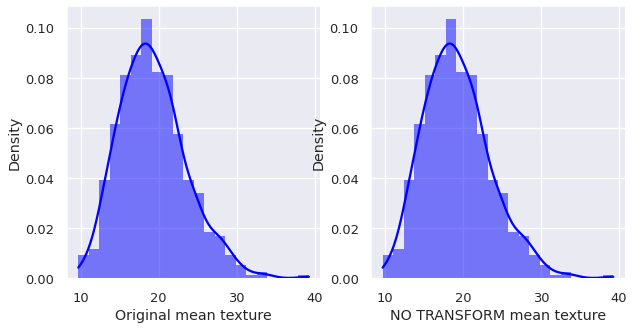


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'mean perimeter' . Skewness = 0.99


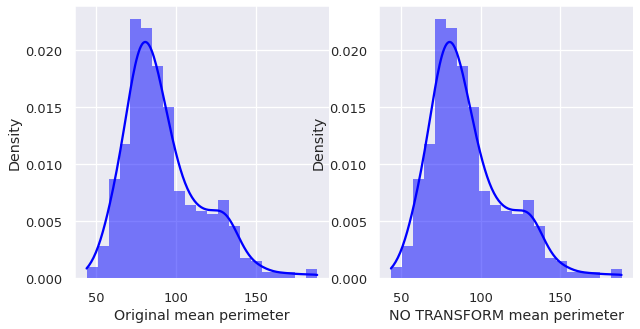


 ------------------------------------------------------

 'mean area' had 'positive' skewness of 1.65

 Transformation yielded skewness of 0.01


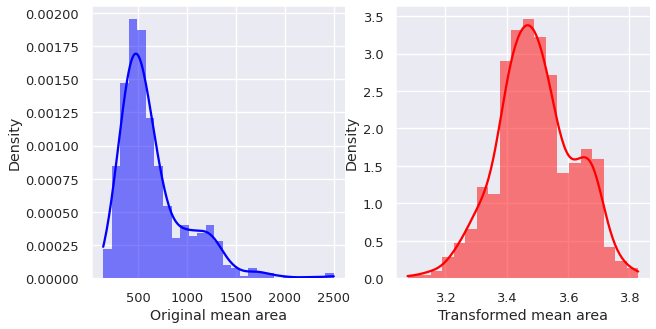


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'mean smoothness' . Skewness = 0.46


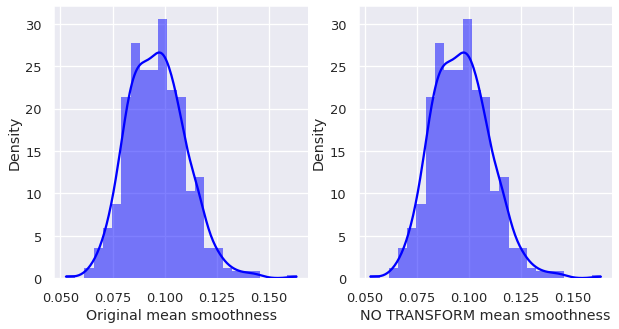


 ------------------------------------------------------

 'mean compactness' had 'positive' skewness of 1.19

 Transformation yielded skewness of -0.00


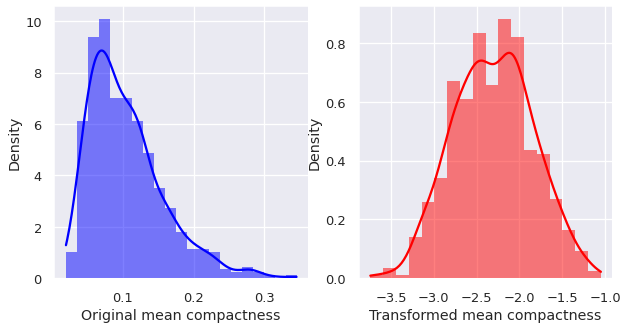


 ------------------------------------------------------

 'mean concavity' had 'positive' skewness of 1.40

 Transformation yielded skewness of -0.02


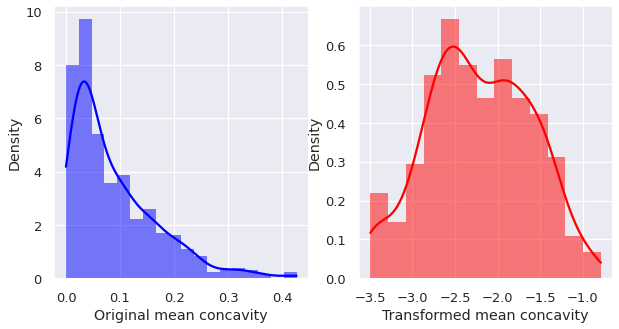


 ------------------------------------------------------

 'mean concave points' had 'positive' skewness of 1.17

 Transformation yielded skewness of -0.01


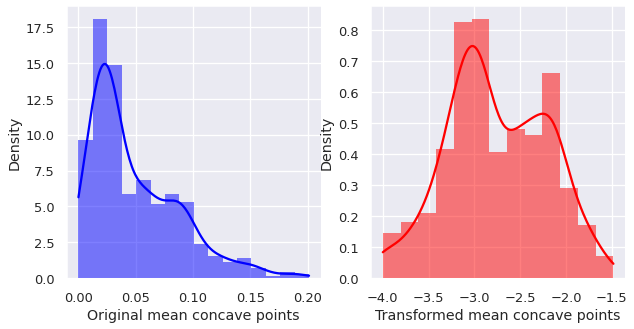


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'mean symmetry' . Skewness = 0.73


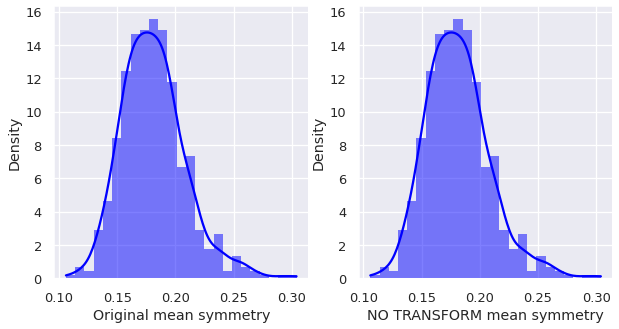


 ------------------------------------------------------

 'mean fractal dimension' had 'positive' skewness of 1.30

 Transformation yielded skewness of 0.01


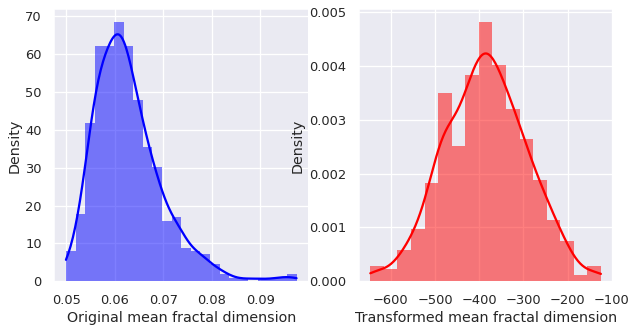


 ------------------------------------------------------

 'radius error' had 'positive' skewness of 3.09

 Transformation yielded skewness of 0.03


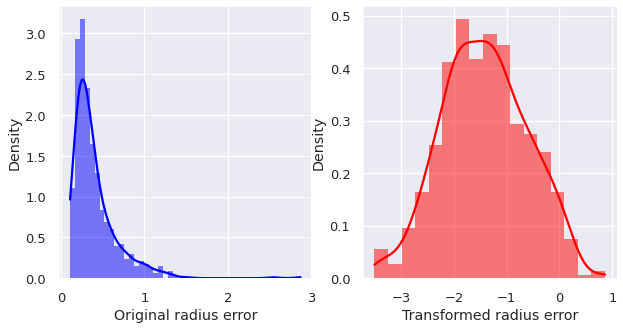


 ------------------------------------------------------

 'texture error' had 'positive' skewness of 1.65

 Transformation yielded skewness of -0.00


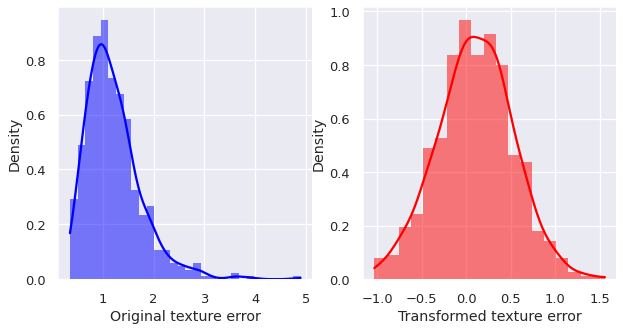


 ------------------------------------------------------

 'perimeter error' had 'positive' skewness of 3.44

 Transformation yielded skewness of 0.03


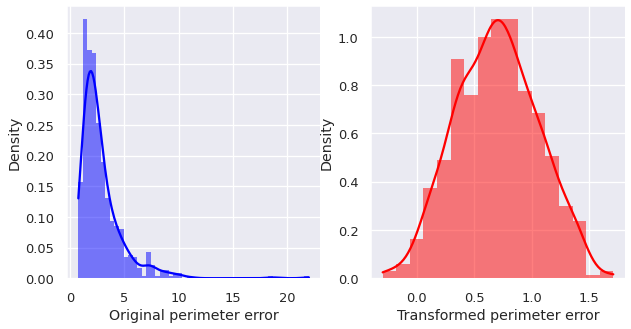


 ------------------------------------------------------

 'area error' had 'positive' skewness of 5.45

 Transformation yielded skewness of 0.06


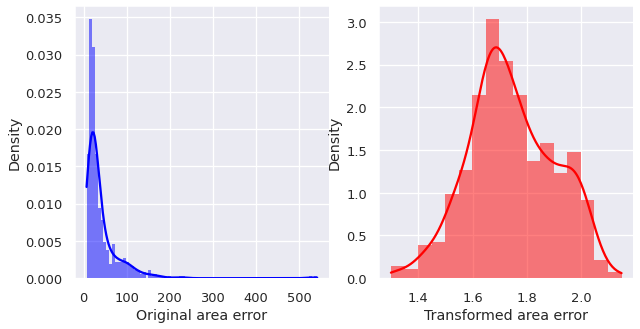


 ------------------------------------------------------

 'smoothness error' had 'positive' skewness of 2.31

 Transformation yielded skewness of -0.02


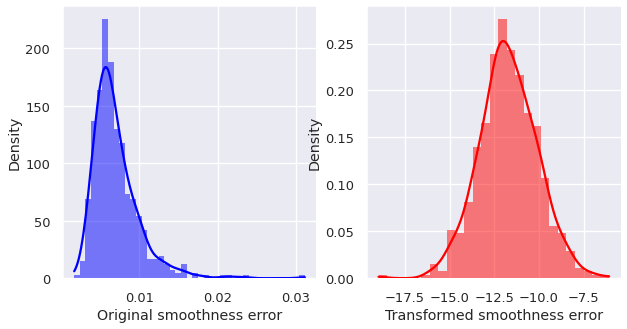


 ------------------------------------------------------

 'compactness error' had 'positive' skewness of 1.90

 Transformation yielded skewness of -0.00


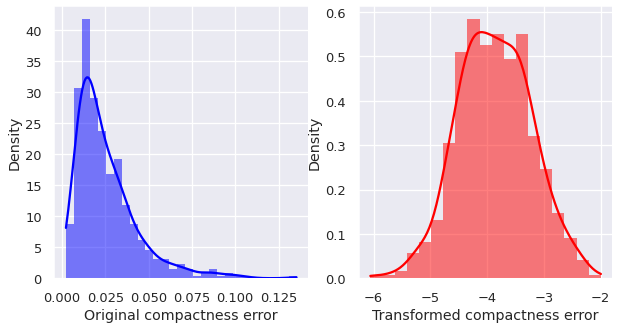


 ------------------------------------------------------

 'concavity error' had 'positive' skewness of 5.11

 Transformation yielded skewness of -0.01


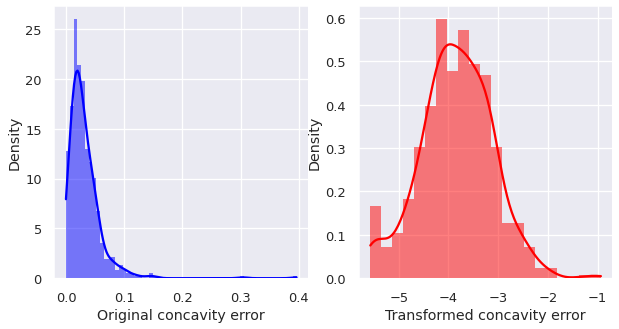


 ------------------------------------------------------

 'concave points error' had 'positive' skewness of 1.44

 Transformation yielded skewness of -0.01


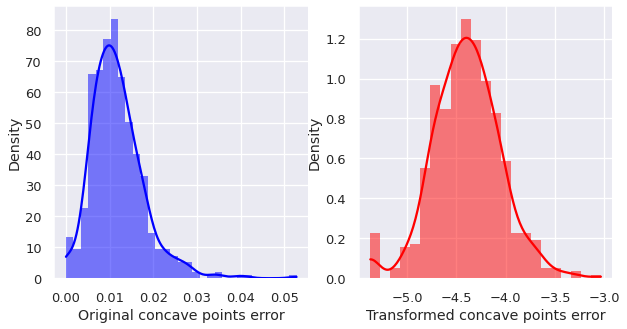


 ------------------------------------------------------

 'symmetry error' had 'positive' skewness of 2.20

 Transformation yielded skewness of 0.01


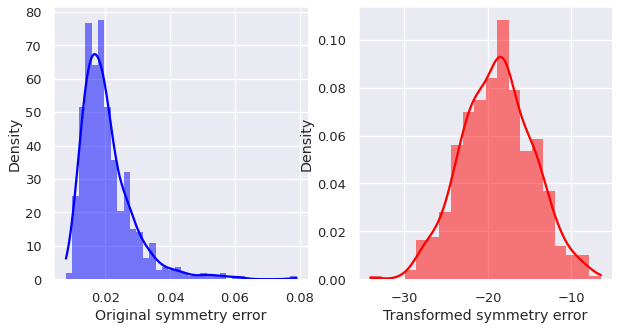


 ------------------------------------------------------

 'fractal dimension error' had 'positive' skewness of 3.92

 Transformation yielded skewness of -0.00


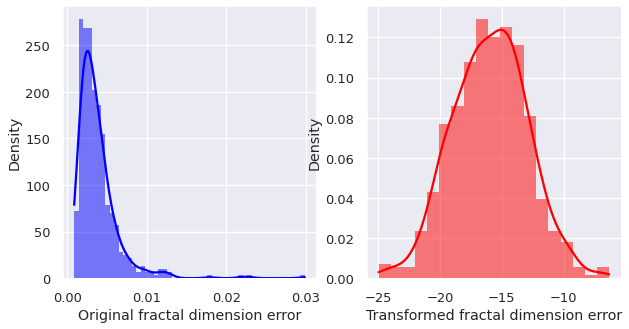


 ------------------------------------------------------

 'worst radius' had 'positive' skewness of 1.10

 Transformation yielded skewness of 0.03


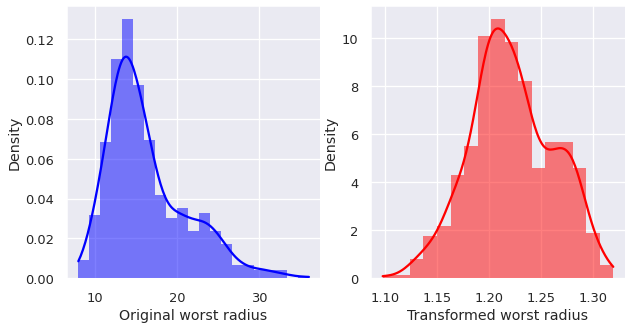


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'worst texture' . Skewness = 0.50


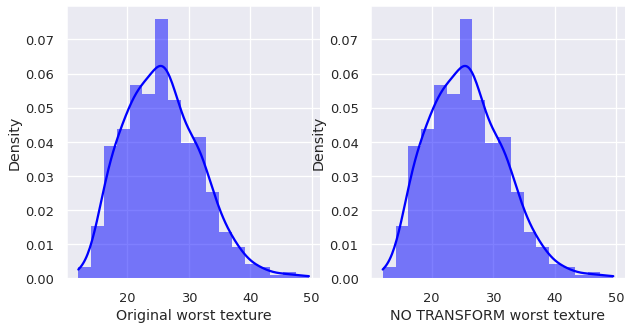


 ------------------------------------------------------

 'worst perimeter' had 'positive' skewness of 1.13

 Transformation yielded skewness of 0.03


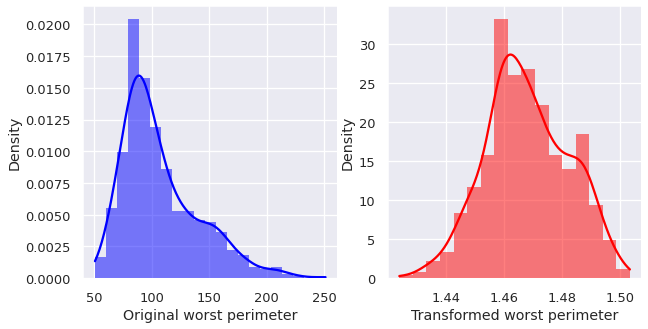


 ------------------------------------------------------

 'worst area' had 'positive' skewness of 1.86

 Transformation yielded skewness of 0.03


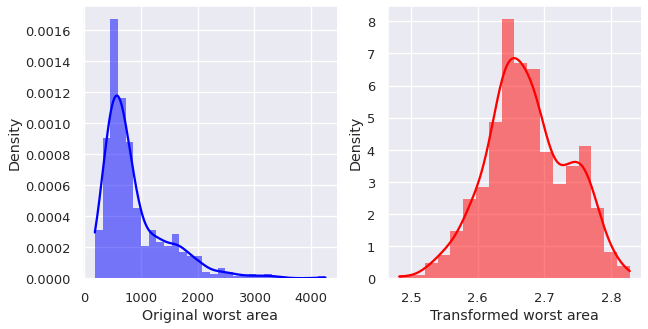


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'worst smoothness' . Skewness = 0.42


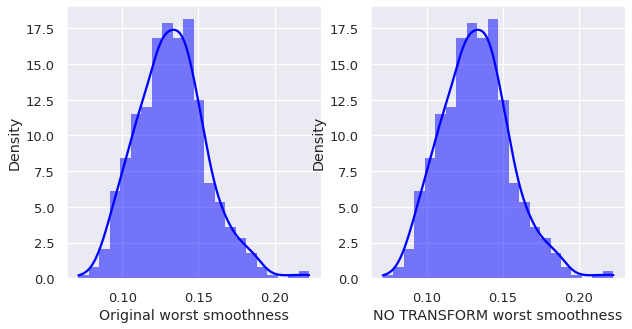


 ------------------------------------------------------

 'worst compactness' had 'positive' skewness of 1.47

 Transformation yielded skewness of -0.01


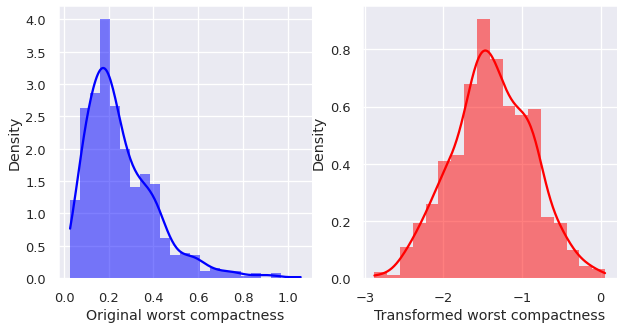


 ------------------------------------------------------

 'worst concavity' had 'positive' skewness of 1.15

 Transformation yielded skewness of -0.06


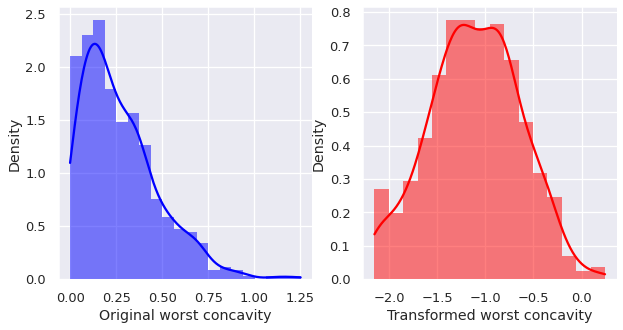


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'worst concave points' . Skewness = 0.49


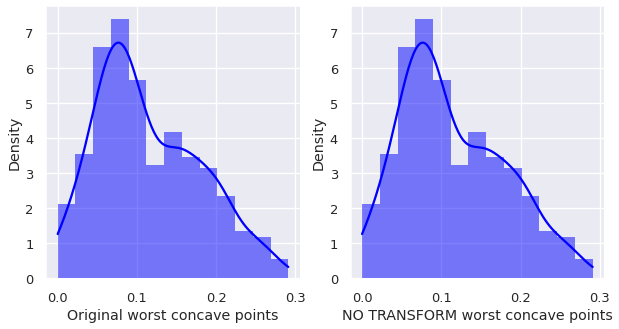


 ------------------------------------------------------

 'worst symmetry' had 'positive' skewness of 1.43

 Transformation yielded skewness of -0.03


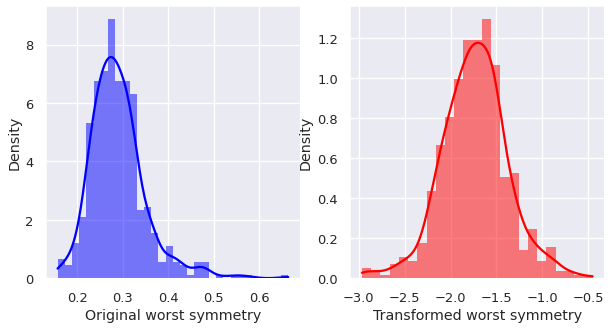


 ------------------------------------------------------

 'worst fractal dimension' had 'positive' skewness of 1.66

 Transformation yielded skewness of 0.02


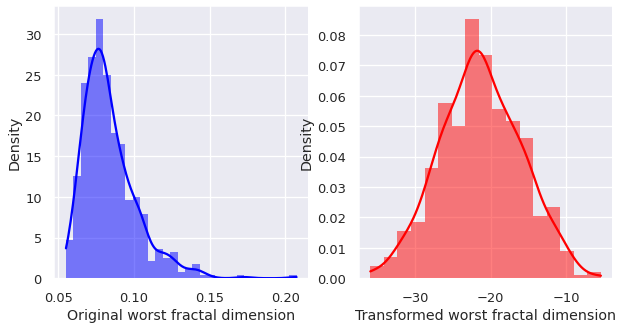

In [ ]:
# Use code above (adapted from https://github.com/datamadness/Automatic-skewness-transformation-for-Pandas-DataFrame) to correct skewness
# All the predictors are real-valued, so we can push them all through the skewness check/correction.
X = skew_autotransform(X.copy(deep=True), plot = True, exp = False, threshold = 1)

#**Outliers**
Detection:
* z-Scores
* Box plots, violin plots or scatter diagrams for univariate outliers. A boxplot is a standardized way of displaying the distribution of data based on a five number summary (“minimum”, first quartile (Q1), median, third quartile (Q3), and “maximum”). It can tell you about your outliers and what their values are. See [this](https://towardsdatascience.com/understanding-boxplots-5e2df7bcbd51#:~:text=A%20boxplot%20is%20a%20standardized,and%20what%20their%20values%20are.) for more.
* Parallel coordinates plot for multivariate outliers. Parallel coordinates plots allow the comparison of multiple features at once, which each feature plotted on a vertical axis that has a unique scale. 

Possible actions to account for outliers:
* Do nothing	
* Deletion (multivariate outliers?)
* Cap values by winsorizing
* Transform (log, power, inverse, etc)
* More sophisticated contextual methods for univariate outliers

Notes:
* Some ML algorithms are highly susceptible to outliers (e.g., multiple linear regression, and kNN)
* Some ML algorithms require (or do better with) normalized attributes , e.g., linear regression, logistic regression, SVM, kNN, and some neural networks. 
* Normalizing attributes with outliers may lead to a concentration of the data in a small subinterval of [0,1]
* **Tukey's Rule**: values below Q1-1.5 IQR or above Q3+1.5 IQR, where Q1 and Q3 are the first and third quartiles, respectively, and IQR is the interquartile range (Q3-Q1). The same limits are obtained using Q2 $\pm$ 2IQR
* **Winsorizing**: see https://en.wikipedia.org/wiki/Winsorizing





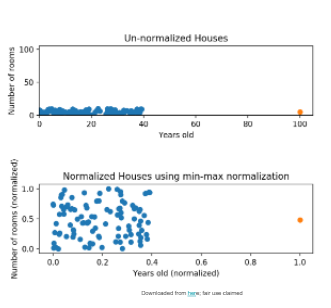

Column  mean radius :  [82, 108, 122, 164, 180, 202, 212, 236, 272, 339, 352, 368, 369, 393, 461, 503, 521, 564]
Column  mean texture :  [219, 232, 239, 259, 265, 455, 562]
Column  mean perimeter :  [82, 108, 122, 164, 180, 202, 212, 236, 272, 339, 352, 369, 393, 461, 503, 521]
Column  mean area :  [101, 212, 461, 538, 539, 568]
Column  mean smoothness :  [3, 105, 122, 504, 520, 568]
Column  mean compactness :  [178]
Column  mean concavity :  []
Column  mean concave points :  []
Column  mean symmetry :  [3, 22, 25, 60, 78, 108, 122, 146, 150, 152, 258, 288, 323, 424, 561]
Column  mean fractal dimension :  [3, 277]
Column  radius error :  [212]
Column  texture error :  [12, 192, 473, 561]
Column  perimeter error :  []
Column  area error :  []
Column  smoothness error :  [116, 122, 149, 192, 213, 263, 314, 489, 505]
Column  compactness error :  [178, 190, 315]
Column  concavity error :  [68, 152]
Column  concave points error :  [12, 68, 101, 140, 152, 174, 175, 192, 213, 288, 314, 389, 3

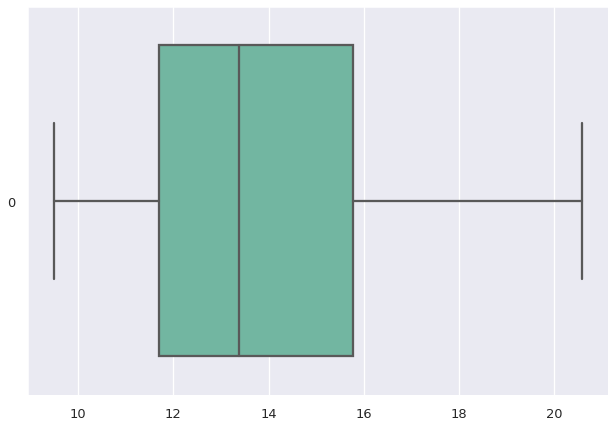

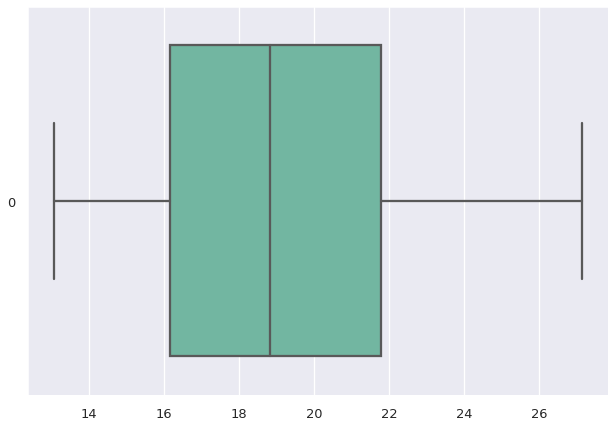

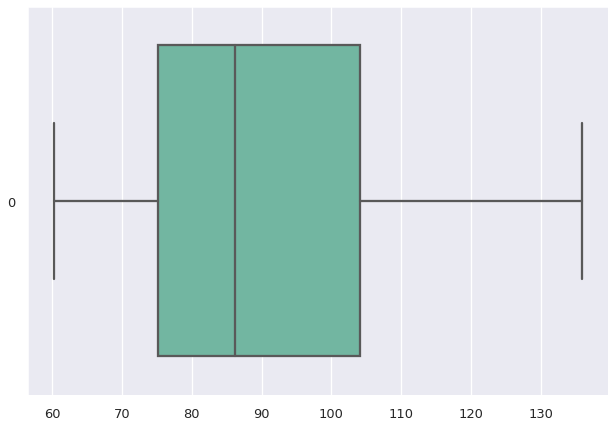

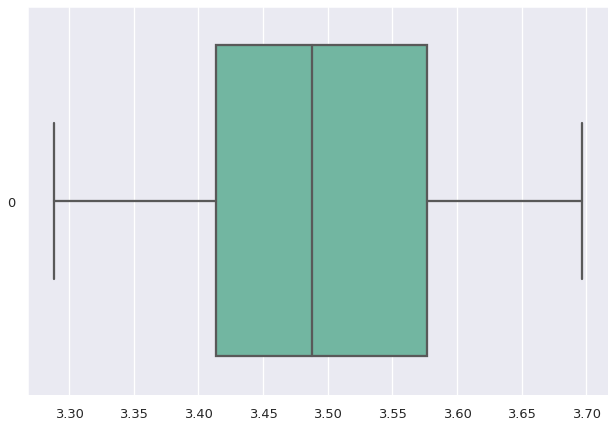

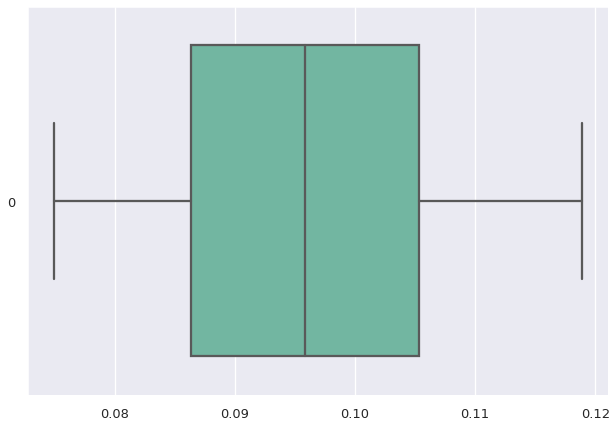

...

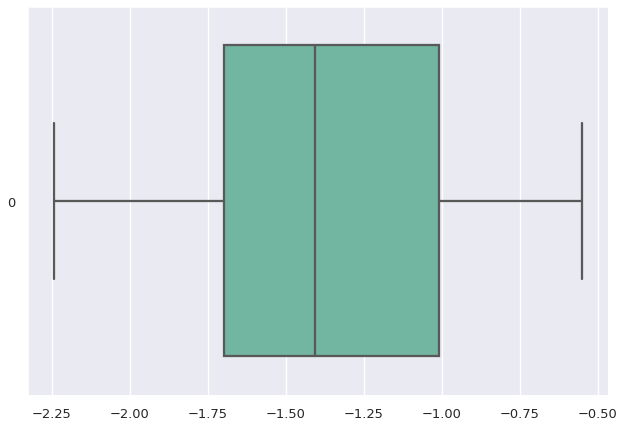

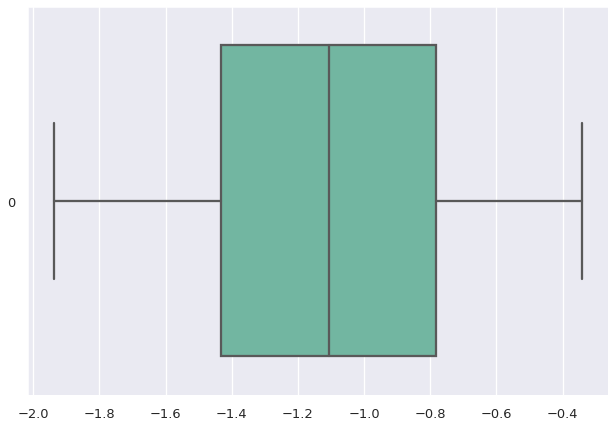

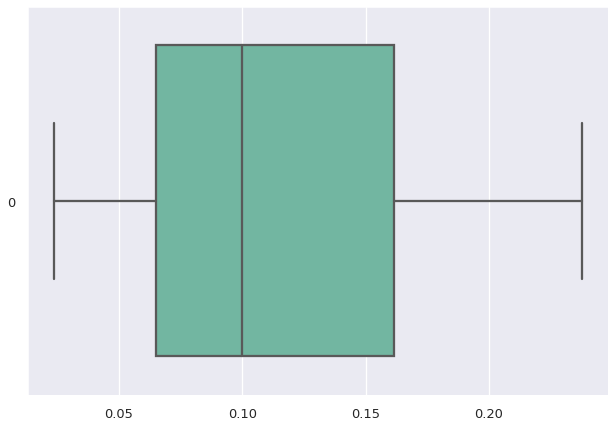

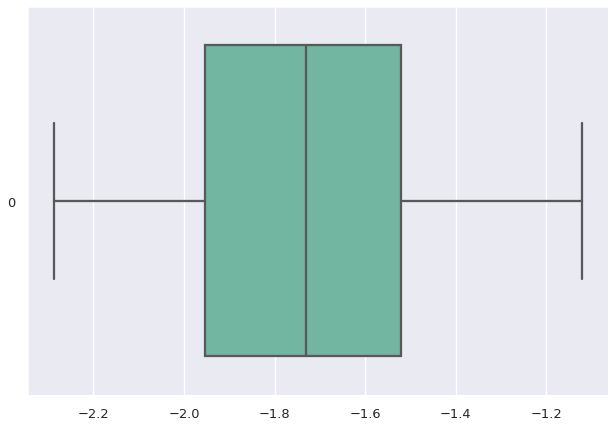

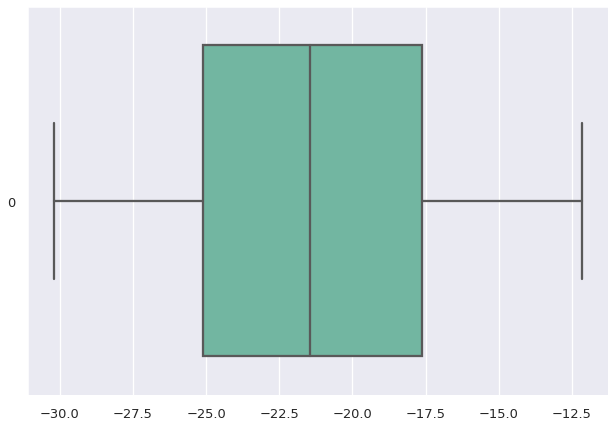

In [ ]:
# Tukey Rule outliers
# As an alternative, you could use z-scores greater than 3 or less than -3.

cols = X.columns
#Tukey's method
def tukey_rule(data, col):
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    upper_lim = data[col].quantile(0.5) + 2 * IQR
    lower_lim = data[col].quantile(0.5) - 2 * IQR
    outliers = []
    for index, x in enumerate(data[col]):
        if x < lower_lim or x >= upper_lim:
            outliers.append(index)
    return outliers

# Identify outliers
for i in cols:
  outliers_Tukey = tukey_rule(X,i)
  print("Column ",i,": ",outliers_Tukey)
  
# Windsorize X and check the results
print("Before", X.describe())
X_winsorized = X.copy(deep=True)
for i in cols:
  X_winsorized[i] = winsorize(X[i], limits=(0.05, 0.05))
print("After", X_winsorized.describe())
for i in cols:
  ax = sns.boxplot(data=X_winsorized[i], orient="h", palette="Set2")
  plt.show()

#**Balance**

**Scaling**


*   Normalization: transform feature range to unit interval. $x=\frac{x-x_{max}}{x_{max}-x_{min}}$
*   Standardization: convert feature values to z-scores: $x=\frac{x-\bar{x}}{s}$



In [ ]:
#Bringing features onto the same scale：normalization and standardization:

# Min-max scaling(Normalization) (https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html)

mms = MinMaxScaler()
X_winsorized_norm = mms.fit_transform(X_winsorized)

# Standardization z-score  (https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html#sklearn.preprocessing.StandardScaler)
# from sklearn.preprocessing import StandardScaler
stdsc = StandardScaler()  
X_winsorized_std = stdsc.fit_transform(X_winsorized)


In [ ]:
# Check for balance
y.describe()


count    569.000000
mean       0.627417
std        0.483918
min        0.000000
25%        0.000000
50%        1.000000
75%        1.000000
max        1.000000
Name: target, dtype: float64

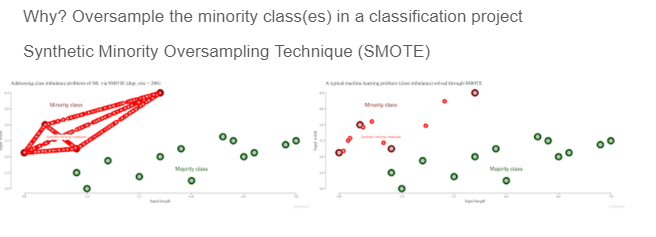

In [ ]:
# Data is unbalanced (37.26% malignant instances)
# Too few instances to undersample (nmeed to preserve data)
# Try SMOTE

import imblearn
print("imblearn version: ", imblearn.__version__)

from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state=2468)
X_winsorized_std_SMOTE, y_SMOTE = sm.fit_resample(X_winsorized_std, y)

print("Shape before SMOTE: ", X_winsorized_std.shape, y.shape, "\n")
print("Shape after SMOTE: ", X_winsorized_std_SMOTE.shape, y_SMOTE.shape, "\n")

imblearn version:  0.8.1
Shape before SMOTE:  (569, 30) (569,) 

Shape after SMOTE:  (714, 30) (714,) 



In [ ]:
# Compare univariate descriptive statistics for predictors before and after SMOTE
print("DS before SMOTE:\n",pd.DataFrame(X_winsorized_std).describe(include='all').T)
print("DS after SMOTE:\n",pd.DataFrame(X_winsorized_std_SMOTE).describe(include='all').T)

DS before SMOTE:
     count          mean      std       min       25%       50%       75%  \
0   569.0 -6.111105e-16  1.00088 -1.431704 -0.740706 -0.215219  0.543117   
1   569.0 -6.813530e-16  1.00088 -1.575951 -0.782563 -0.097014  0.662996   
2   569.0  6.555974e-17  1.00088 -1.425172 -0.743708 -0.235022  0.585676   
3   569.0 -1.251879e-15  1.00088 -1.794014 -0.706125 -0.066855  0.708394   
4   569.0 -2.470197e-16  1.00088 -1.698242 -0.782158 -0.018754  0.739025   
5   569.0 -5.209658e-16  1.00088 -1.774552 -0.769424 -0.002996  0.741334   
6   569.0 -2.142399e-16  1.00088 -1.823276 -0.760746 -0.046403  0.836983   
7   569.0  3.625298e-16  1.00088 -1.763240 -0.745879 -0.174855  0.899116   
8   569.0 -1.142418e-15  1.00088 -1.644145 -0.777674 -0.057002  0.630343   
9   569.0  3.510178e-16  1.00088 -1.765458 -0.797734 -0.018015  0.716861   
10  569.0 -2.097522e-17  1.00088 -1.718653 -0.761872 -0.019182  0.734850   
11  569.0  5.268194e-18  1.00088 -1.868731 -0.731318  0.003781  0.7373

#**Strength of Predictors**

##*Pairplot*

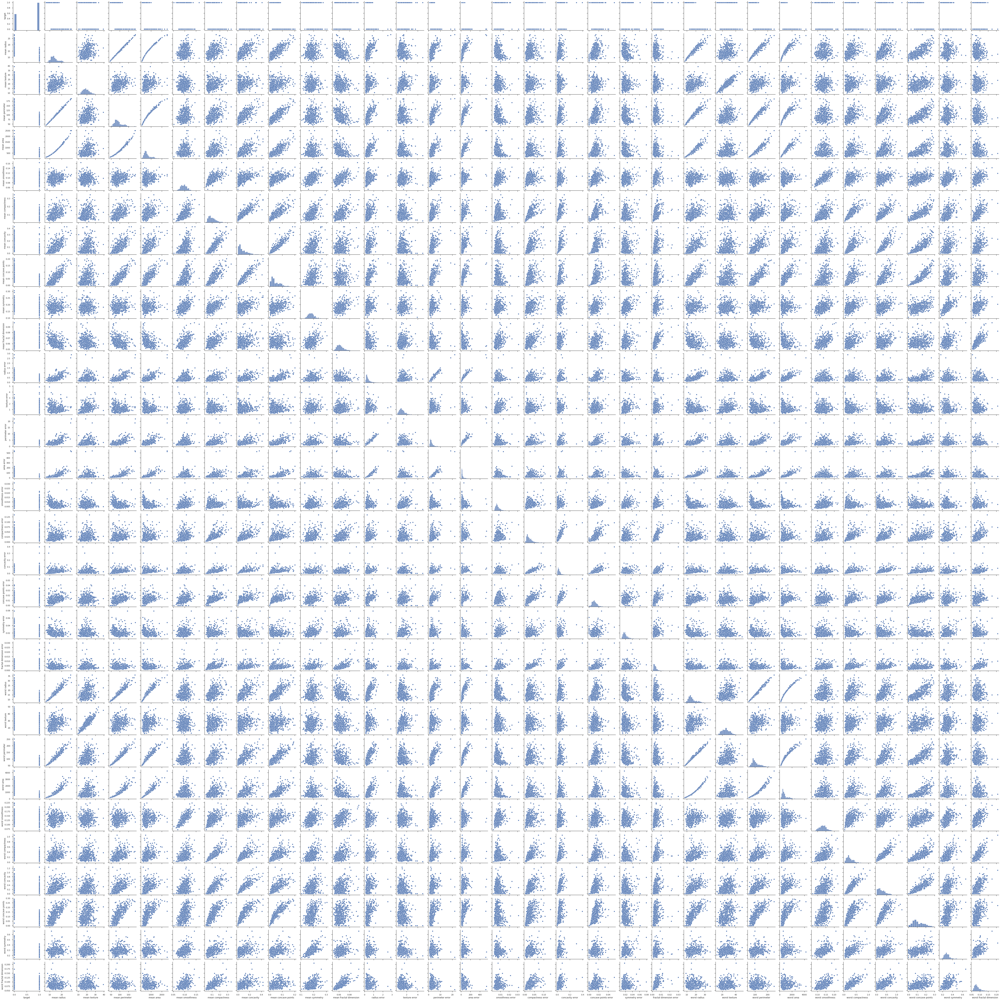

In [ ]:
# Scatterplot matrix - these can take some time to gerenerate if the number of features is large
sns.set_theme(style="ticks")
sns.pairplot(df)

##*Principal Components Analysis (PCA)*

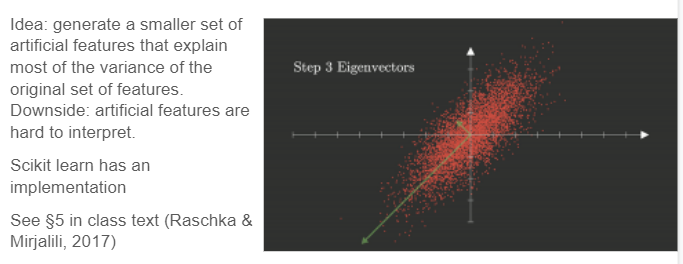

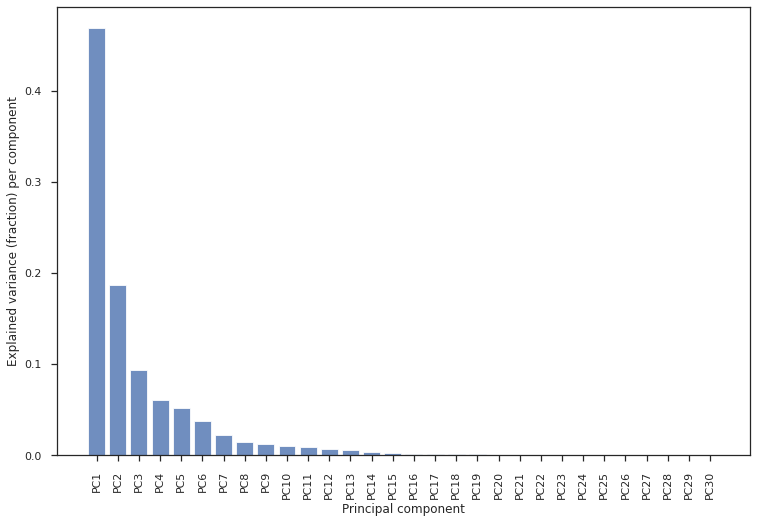

In [ ]:
# Principal Components Analysis
# Examine the explained variance ratio in order for each components
pca = PCA()
X_winsorized_pca = pca.fit_transform(X_winsorized_std)
pca.explained_variance_ratio_

pca_explained_variance_bar(pca, alpha=0.8)
plt.show()

# This suggests that we may be able to use two or three (and certainly no more than 6 pricipal components) to build models

In [ ]:
# Pairplot the principal component data
import plotly.express as px
components = pca.fit_transform(X_winsorized)
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(4),
    color=df["target"]
)
fig.update_traces(diagonal_visible=False) 
fig.show()

#**Conclusions**
- No missing value or duplicate pre-processing needed
- Corrected for skewness
- Winsorized outliers in order to preserve data
- Two to three principal components may be sufficient to build a satisfactory model
- The data set is unbalanced (37.26% of the instances are for malignant masses). We can try building the models using the unbalanced data, or we can try SMOTE. There is likely too little data to contemplate undersampling. 